VI + AutoRegressive Timeseries Problem description:
* PDE solutions: $u \sim N(\mu, \sigma)$ s.t. $\mu \in M \subset R^m$, $\sigma \in \Sigma \subset R^m$
  * we're assuming all dimensions (e.g. spatial) are flattened, and we're using tensor/vector (not function) notation
* PDE update: $f(\mu)$ (aka `NSupd()`), maps $f:M \rightarrow M$
* Deterministic Neural Operator: $N(\mu)$, maps $N: M \rightarrow M$
* VI Neural Operator: $N(\mu)$, maps $N: M \rightarrow M \times \Sigma$

So before we could directly/naively compose $\mu_{t+1}=N\circ f(\mu_t)$. <br>
**But now the codomain of the Neural operator has changed to $M \times \Sigma$ so that composition is invalid.**

This leaves me considering 2 notable options:
1. Redefine the Neural Operator as $N: M \times \Sigma \rightarrow M \times \Sigma$ and the update equation as $(\mu_{t+1}, \sigma_{t+1})=N(f(\mu_t), \sigma_t)$
2. Or sample $u_t \sim N(\mu_t, \sigma_t)$ and pass forward: $(\mu_{t+1}, \sigma_{t+1})=N(f(u_t))$

Right now I'm using option 1, but I'm beginning to wonder if I'm also supposed to sample from the aleatoric uncertainty? <br>
And if so should this only happen for evaluation? Or even only after autoregressive recursion is finished (i.e. the same way it happens during training)?

# Setup & Loading:

In [29]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
import torch
from torch import nn
import numpy as np
import matplotlib.pyplot as plt
import pytorch_lightning as L
import torch.nn.functional as F
import torch.multiprocessing
torch.multiprocessing.set_sharing_strategy('file_system')

from lightning_utils import *
import JHTDB_sim_op

fields = lambda x: [name for name in vars(x) if not name.startswith('_')] # utility to see public fields
def tshow(x): # utility to "show" tensors without overwhelming people
    try: x = x.cpu()
    except: pass
    x = np.asarray(x)
    print('='*30)
    print(f'{x.shape=}\n{x.dtype=}\n{x.min()=:.2e}\n{x.max()=:.2e}\n{x.mean()=:.2e}\n{x.std()=:.2e}')
    print('='*30)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


/home/dsdeigh/miniforge3/envs/uqops+proxy/lib/python3.10/site-packages/IPython/core/pylabtools.py:77: DeprecationWarning: backends is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(


### Here we load the actual DNS dataset:

In [2]:
def load_full_dataset_field(dataset_path):
    import os
    cache_path = f'{dataset_path}/full_field_cache.pt'
    if os.path.exists(cache_path): # almost x3 faster!
        print('loading from cache!')
        return torch.load(cache_path)

    dataset = JHTDB_sim_op.JHTDB_Channel(dataset_path, time_chunking=1)
    data_loader = torch.utils.data.DataLoader(dataset, batch_size=1, num_workers=16)
    x, _ = next(iter(data_loader))
    print(f'{x.shape=}')

    full_field = torch.stack([x.squeeze() for x, _ in data_loader], axis=-1)
    print(f'{full_field.shape=}, {full_field.device=}')
    torch.save(full_field, cache_path)
    return full_field
import time
start_time = time.time()
real_channel_flow = load_full_dataset_field('data/turbulence_output').detach()
no_filter_channel_flow = load_full_dataset_field('data/turbulence_f1_output').detach()

print(f'loading duration (sec): {time.time()-start_time}')

loading from cache!
loading from cache!
loading duration (sec): 7.534888744354248


In [4]:
!nvidia-smi

Fri Nov  1 13:12:46 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:07:00.0 Off |                    0 |
| N/A   32C    P0             54W /  400W |       5MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [3]:
# wrapper to nullify the prior_cfg kwd_arg (for compatibility)
from JHTDB_sim_op import POU_NetSimulator, PPOU_NetSimulator
class POU_NetSimulator(POU_NetSimulator):
    def __init__(self, *args, prior_cfg={}, train_dataset_size=None, **kwd_args):
        super().__init__(*args, **kwd_args)

def load_model(path, device='cuda:5', **kwd_args):
    ''' Wraps up all the nonsense involved in loading an inference model properly into one function. '''
    # user-provided kwd_args has precedence in update
    kwd_args = {'n_inputs': 3, 'n_outputs': 3, 'ndims': 3} | kwd_args
    if 'VI' in path:
        print('loading VI model...')
        model = PPOU_NetSimulator.load_from_checkpoint(path, **kwd_args)
    else:
        print('loading deterministic model...')
        model = POU_NetSimulator.load_from_checkpoint(path, **kwd_args)

    model = model.to(device)
    model.eval()

    # freeze everything
    for parameter in model.parameters():
        parameter.requires_grad=False
    print('done!')
    return model

#model = load_model('best_VI_model.ckpt')
model = load_model('/scratch/dsdeigh/best_models/partial_VI_model2.ckpt')
#model = load_model('best_model1.ckpt', trig_encodings=False)
sim_model = model.simulator

loading VI model...
done!


# 3d Expert Partitions

In [5]:
u0 = sim_model.genIC().detach() # random IC
gating_weights, topk = model.gating_net(u0[None])
topk_sort_idx = torch.argsort(topk)
gating_weights, topk = gating_weights[:,topk_sort_idx], topk[topk_sort_idx]
gating_weights = gating_weights[0].cpu() # ditch batch dim & move to cpu
print(f'{gating_weights.shape=}')

gating_weights.shape=torch.Size([2, 103, 26, 77])


In [6]:
# add the zero expert weight
ones = torch.ones(1,*gating_weights.shape[1:], dtype=gating_weights.dtype, device=gating_weights.device)
zero_weight = ones - gating_weights.sum(axis=0)
gating_weights = torch.cat([zero_weight, gating_weights], axis=0)
print(f'{gating_weights.shape=}')

gating_weights.shape=torch.Size([3, 103, 26, 77])


In [7]:
# check if others are different? turns out the others are used a little bit
print('spatially averaged gating weights for each expert:', torch.vmap(torch.mean)(gating_weights).numpy())

spatially averaged gating weights for each expert: [1.20816876e-04 7.05522716e-01 2.94356495e-01]


NOTE: expert #0 is also literally the "Zero Expert"


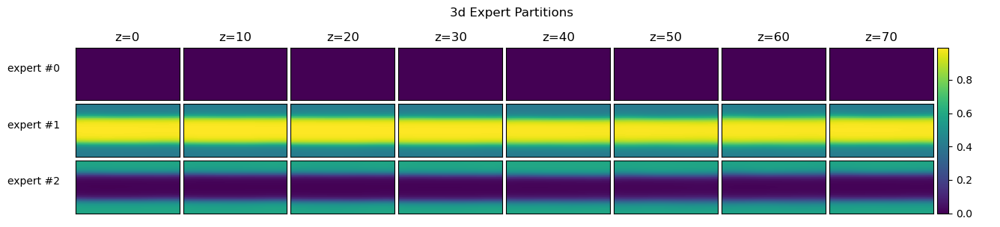

Saving GridFigure to: ./grid_figures/3d_Expert_Partitions.png


In [8]:
from grid_figures import GridFigure
fig = GridFigure(f'3d Expert Partitions', y_title_vertical=False)

print('NOTE: expert #0 is also literally the "Zero Expert"')
for expert_i in range(gating_weights.shape[0]):
    fig.add_3d_row(gating_weights[expert_i], f'expert #{expert_i}', x_title_func=lambda t: f'z={t}',
                   img_getter=lambda array_3d, t: array_3d[:,:,t].T, time_samples=list(range(0,77,10)))
fig.show()

# Run Simulation:

In [47]:
%pdb
#u0 = sim_model.genIC().detach() # random IC
u0 = real_channel_flow[..., 0].to(model.device)
with torch.inference_mode():
    sim_steps = model(u0, n_steps=4000, intermediate_output_stride=999, divergence_free=False)
    #sim_steps = sim_model.evolve(u0, n=4001, intermediate_outputs=True, intermediate_output_stride=999)

# handle uq
if type(sim_steps) is tuple:
    assert len(sim_steps)==2
    sim_steps, sim_steps_uq = sim_steps # keep them seperate so later code works
    sim_steps_uq=sim_steps_uq.cpu()
sim_steps = sim_steps.cpu()

Automatic pdb calling has been turned OFF


# Run UQ Simulations 
(sample epistemic params and get Moments via law of Total Variance)

In [18]:
%pdb off
# Adapted to stack aleatoric moments
def get_BNN_pred_distribution(bnn_model, x_inputs, n_samples=100, no_grad=True, **kwd_args):
    '''
    If you just want moments use get_BNN_pred_moments() instead as it is *much* more memory efficient (e.g. for large sample sizes). But this is still useful if you want an actual distribution.
    '''
    if no_grad:
        with torch.inference_mode():
            return get_BNN_pred_distribution(bnn_model, x_inputs, n_samples, no_grad=False, **kwd_args)
    preds_mu, preds_sigma = [], []
    x_inputs = x_inputs.to(model.device).float()
    print_interval=max(n_samples//10,1)
    try:
        import warnings
        warnings.filterwarnings("error")
        while len(preds_mu)<n_samples:
            if len(preds_mu)%print_interval==0:
                print(f'{len(preds_mu)+1}th moment sample')
            try: # handle NaN samples by retrying
                mu, sigma = bnn_model(x_inputs, **kwd_args)
                preds_mu.append(mu) # will only reach here if no NaNs happened
                preds_sigma.append(sigma)
            except UserWarning as e: # catch NaN warning
                assert 'NaNs' in str(e), 'Wrong warning caught! fix this'
                print(e) # sanity check
    finally:
        warnings.resetwarnings()
    preds_mu = torch.stack(preds_mu, axis=0)
    preds_sigma = torch.stack(preds_sigma, axis=0)
    return preds_mu, preds_sigma

# updated uses laws of total variance and expectation
def get_BNN_pred_moments(bnn_model, x_inputs, n_samples=100, no_grad=True, **kwd_args):
    if no_grad:
        with torch.inference_mode():
            return get_BNN_pred_moments(bnn_model, x_inputs, n_samples=n_samples, no_grad=False, **kwd_args)
    
    total_expectation = 0 # E[Y] = E[E[Y|Z]]
    total_variance = 0 # Var[Y] = E[Var[Y|Z]]+Var[E[Y|Z]]
    mus = [] # necessary for 2nd term in total variance eq.
    assert n_samples>1
    print_interval=max(n_samples//10,1)

    try:
        import warnings
        warnings.filterwarnings("error")
        i=0
        while i<n_samples:
            if i%print_interval==0:
                print(f'{i}th moment sample')

            try: # handle NaN samples by retrying
                mu, sigma = bnn_model(x_inputs.float(), **kwd_args)
                mus.append(mu)
                i+=1 # will only reach here if no NaNs happened
            except UserWarning as e: # catch NaN warning
                assert 'NaNs' in str(e), 'Wrong warning caught! fix this'
                print(e) # sanity check
                continue

            total_expectation = total_expectation + mu
            total_variance = total_variance + sigma**2

        # take average
        total_expectation = total_expectation/n_samples
        total_variance = total_variance/n_samples
        
        # add in the explained variance term (2nd term) = Var(mus) = Var[E[Y|Z]]
        total_variance = total_variance + sum([(mu-total_expectation)**2/len(mus) for mu in mus])
    finally:
        warnings.resetwarnings()

    return total_expectation.cpu().detach(), (total_variance**0.5).cpu().detach()

Automatic pdb calling has been turned OFF


In [26]:
u0 = real_channel_flow[..., 0].to(model.device)
pred_distribution = get_BNN_pred_distribution(model, u0, n_samples=12, n_steps=4000, intermediate_output_stride=999)
pred_distribution = torch.distributions.normal.Normal(*pred_distribution)#, validate_args=False)
pred_samples = pred_distribution.sample() # then sample the actual predictions from the sampled aleatoric distributions

print(f'pred_samples size GBs: {np.prod(pred_samples.shape)*4/1e9}')

1th moment sample


KeyboardInterrupt: 

In [41]:
tshow(pred_samples)

def torch_IQR(tensor, axis=None):
    upper_quantile = tensor.quantile(0.75, axis=axis)
    lower_quantile = tensor.quantile(0.25, axis=axis)
    IQR = (upper_quantile-lower_quantile).abs()
    return IQR

pred_median = pred_samples.median(axis=0).values.cpu()
pred_IQR = torch_IQR(pred_samples, axis=0).cpu()

x.shape=(10, 3, 103, 26, 77, 5)
x.dtype=dtype('float32')
x.min()=-3.0183833
x.max()=5.3409753
x.mean()=0.28617066
x.std()=0.44152695


In [39]:
sim_steps, sim_steps_uq = pred_median, pred_IQR
tshow(sim_steps)
tshow(sim_steps_uq)

x.shape=(3, 103, 26, 77, 5)
x.dtype=dtype('float32')
x.min()=-0.47880745
x.max()=1.2408468
x.mean()=0.28431535
x.std()=0.4410338
x.shape=(3, 103, 26, 77, 5)
x.dtype=dtype('float32')
x.min()=0.0001471173
x.max()=2.444436
x.mean()=0.01775436
x.std()=0.0137526225


### TODO: modify below so that it can handle sparisty of the f40 dataset
(consider using the dataset directly; it should be possible to adapt the GridFigure class to use it)

In [9]:
# wrapper of above that also computes absolute error & has custom logic for the problem
def get_BNN_pred_moments_and_error(model, dataset, n_samples=10, n_steps=4000, intermediate_output_stride=999, **kwd_args):
    u0 = dataset[..., 0].to(model.device)
    sim_steps, sim_steps_uq = get_BNN_pred_moments(model, u0, n_samples=n_samples, n_steps=n_steps,
                                                   intermediate_output_stride=intermediate_output_stride, **kwd_args)
    with torch.inference_mode():
        abs_error = (dataset[...,::intermediate_output_stride]-sim_steps).abs()
    return sim_steps.cpu().detach(), sim_steps_uq.cpu().detach(), abs_error.cpu().detach()

In [10]:
u0 = real_channel_flow[..., 0].to(model.device)
sim_steps, sim_steps_uq, abs_error = get_BNN_pred_moments_and_error(model, real_channel_flow)
sim_steps_OOD, sim_steps_uq_OOD, abs_error_OOD = get_BNN_pred_moments_and_error(model, no_filter_channel_flow)

0th moment sample
1th moment sample
2th moment sample
3th moment sample
4th moment sample
5th moment sample
6th moment sample
Simulation has diverged into NaNs! At step: 874
6th moment sample
7th moment sample
8th moment sample
9th moment sample
0th moment sample
Simulation has diverged into NaNs! At step: 867
0th moment sample
1th moment sample
2th moment sample
Simulation has diverged into NaNs! At step: 978
2th moment sample
3th moment sample
4th moment sample
5th moment sample
Simulation has diverged into NaNs! At step: 64
5th moment sample
6th moment sample
7th moment sample
8th moment sample
9th moment sample


In [ ]:
sim_steps_mu, sim_steps_sigma = sim_steps, sim_steps_uq

In [ ]:
print(f'{u0.shape=}\n{sim_steps.shape=}\n{real_channel_flow.shape=}')

In [34]:
print(f'{no_filter_channel_flow.shape=}')
print(f'{real_channel_flow.shape=}')

no_filter_channel_flow.shape=torch.Size([3, 103, 26, 77, 4000])
real_channel_flow.shape=torch.Size([3, 103, 26, 77, 4000])


In [ ]:
# swap what the visualization is made from
sim_steps_uq, sim_steps = sim_steps, sim_steps_uq

In [ ]:
# swap what the visualization is made from
sim_steps_uq, sim_steps = sim_steps, sim_steps_uq

## Display Simulation:

##################################################
Learned Simulation:


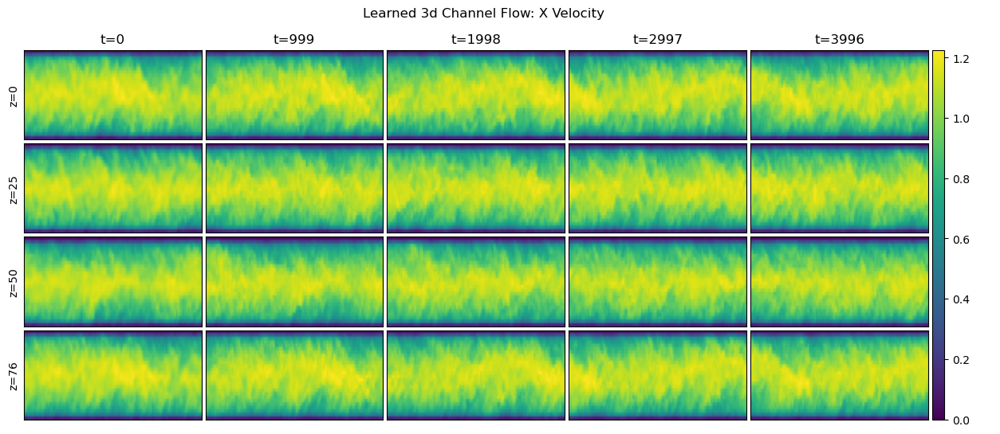

Saving GridFigure to: ./grid_figures/Learned_3d_Channel_Flow_X_Velocity.png
##################################################
DNS Simulation:


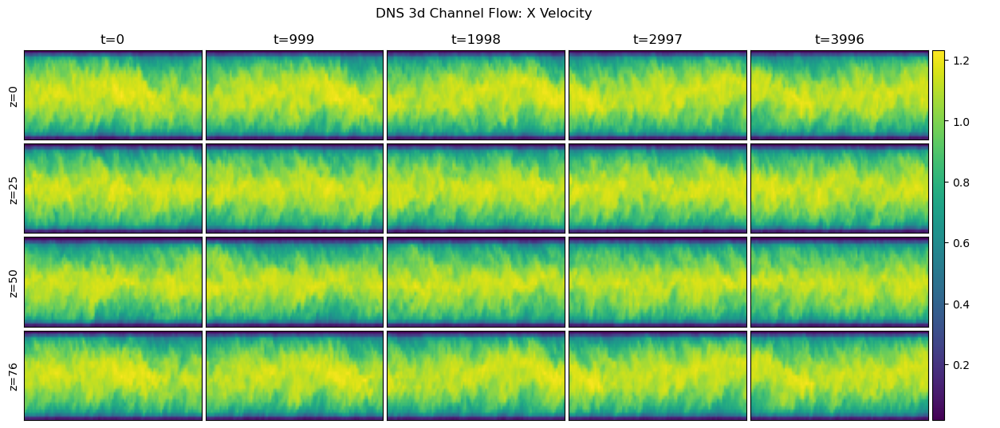

Saving GridFigure to: ./grid_figures/DNS_3d_Channel_Flow_X_Velocity.png
##################################################
Learned Simulation:


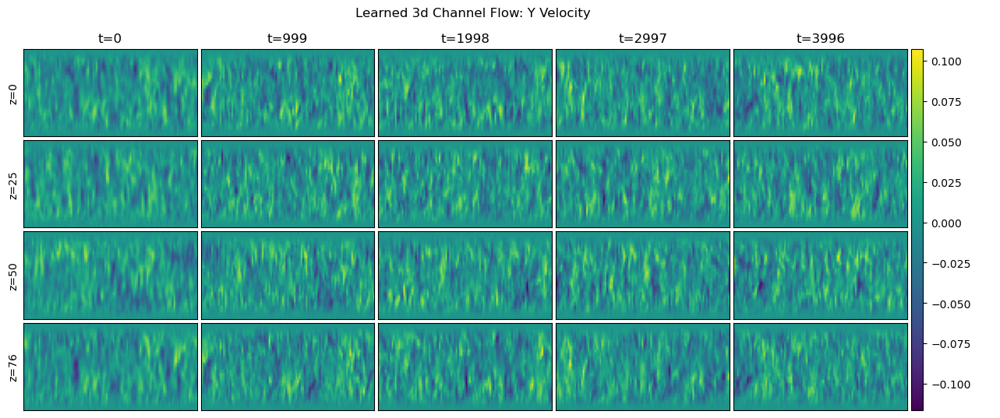

Saving GridFigure to: ./grid_figures/Learned_3d_Channel_Flow_Y_Velocity.png
##################################################
DNS Simulation:


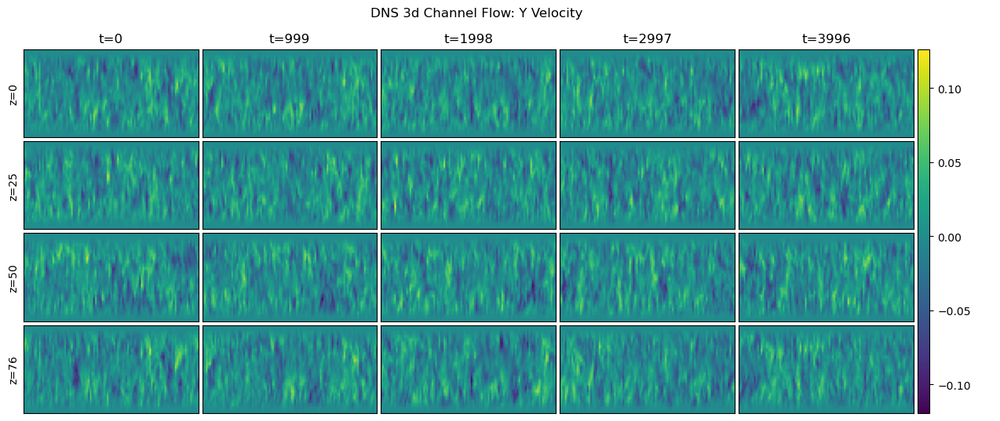

Saving GridFigure to: ./grid_figures/DNS_3d_Channel_Flow_Y_Velocity.png
##################################################
Learned Simulation:


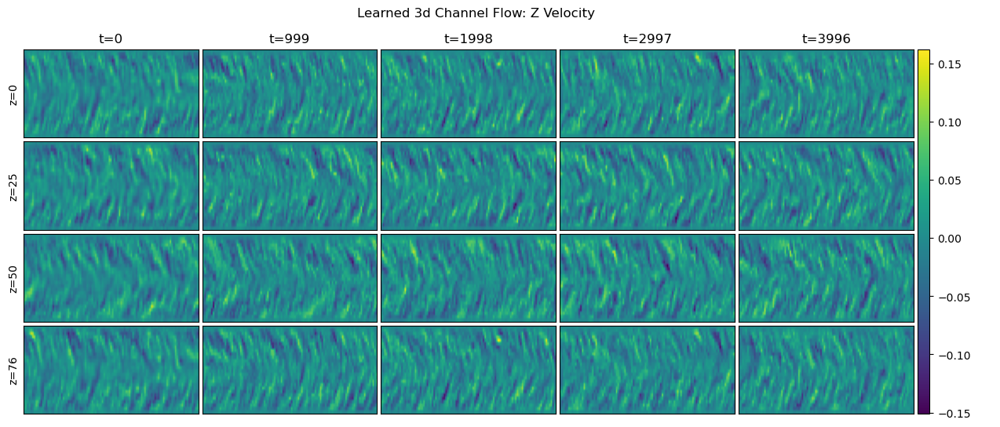

Saving GridFigure to: ./grid_figures/Learned_3d_Channel_Flow_Z_Velocity.png
##################################################
DNS Simulation:


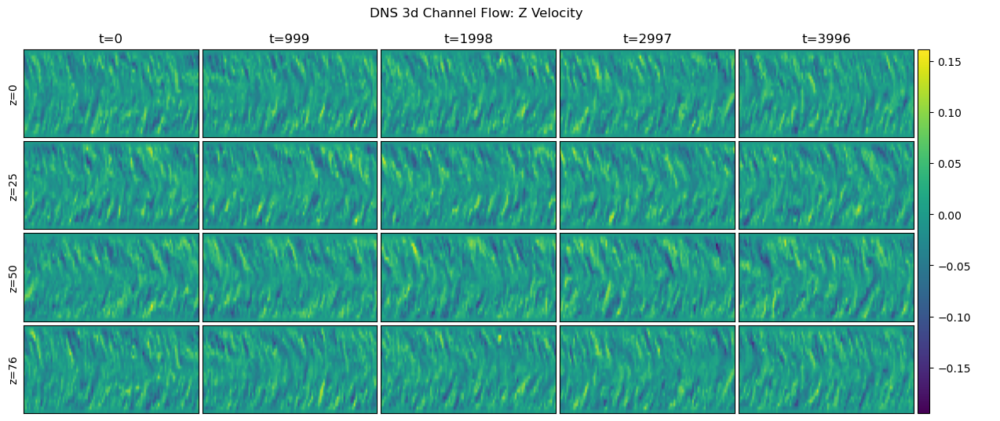

Saving GridFigure to: ./grid_figures/DNS_3d_Channel_Flow_Z_Velocity.png


In [49]:
def make_4d_sim_fig(sim_data, vel_comp_idx:int, prefix='', time_stride=999, vel_component_name = ['X','Y','Z']):
    from grid_figures import GridFigure
    fig = GridFigure(f'{prefix}3d Channel Flow: {vel_component_name[vel_comp_idx]} Velocity')
    sim_data = sim_data.cpu()
    for z in np.linspace(0, 76, num=4, dtype=int):
        fig.add_3d_row(sim_data[vel_comp_idx,:,:,z], f'{z=}', x_title_func=lambda t: f't={t*time_stride}',
                       img_getter=lambda array_3d, t: array_3d[:,:,t].T, time_samples=list(range(sim_data.shape[-1])))
    fig.show()

def create_all_simulation_figs(predicted_sim_steps, true_sim_steps, predicted_prefix='Learned ', true_prefix='DNS ',
                               time_stride=999, time_end=None, **kwd_args):
    for i in range(3):
        print('#'*50 + f'\n{predicted_prefix}Simulation:')
        make_4d_sim_fig(predicted_sim_steps, i, time_stride=time_stride, prefix=predicted_prefix)
        print('#'*50 + f'\n{true_prefix}Simulation:')
        make_4d_sim_fig(true_sim_steps[...,:time_end:time_stride], i, time_stride=time_stride, prefix=true_prefix)

import random
create_all_simulation_figs(sim_steps, real_channel_flow)

##################################################
Learned OOD Simulation:


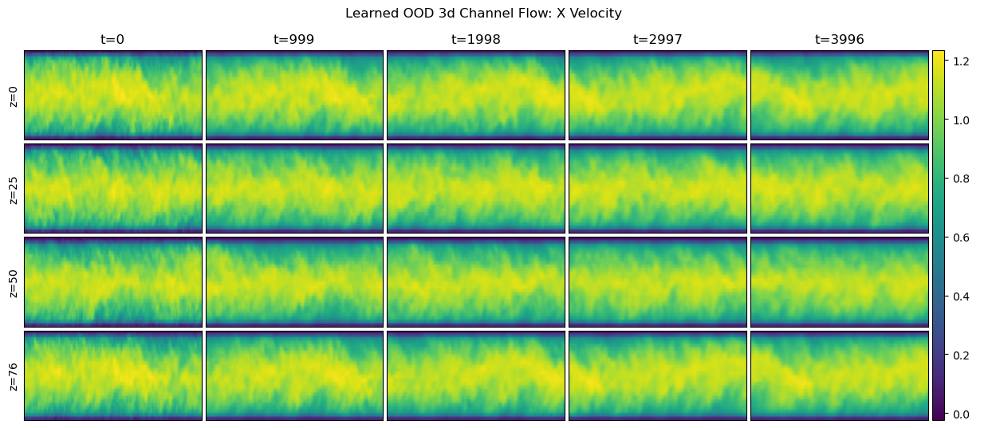

Saving GridFigure to: ./grid_figures/Learned_OOD_3d_Channel_Flow_X_Velocity.png
##################################################
DNS OOD Simulation:


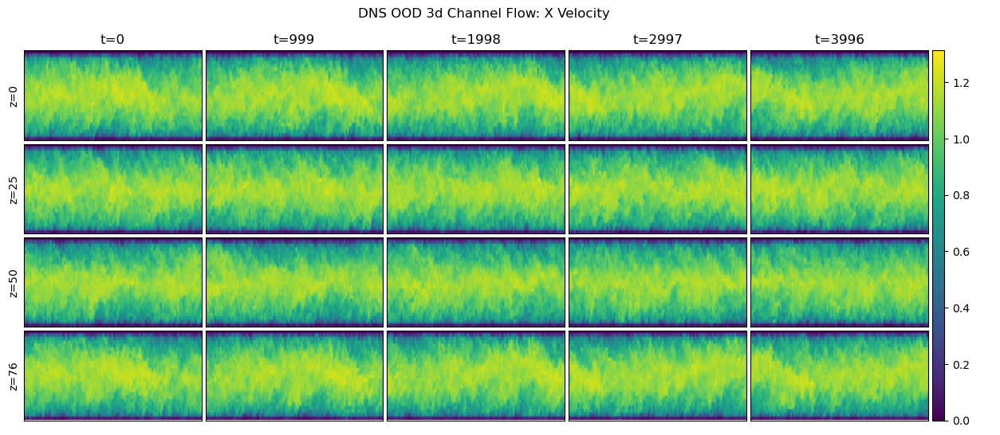

Saving GridFigure to: ./grid_figures/DNS_OOD_3d_Channel_Flow_X_Velocity.png
##################################################
Learned OOD Simulation:


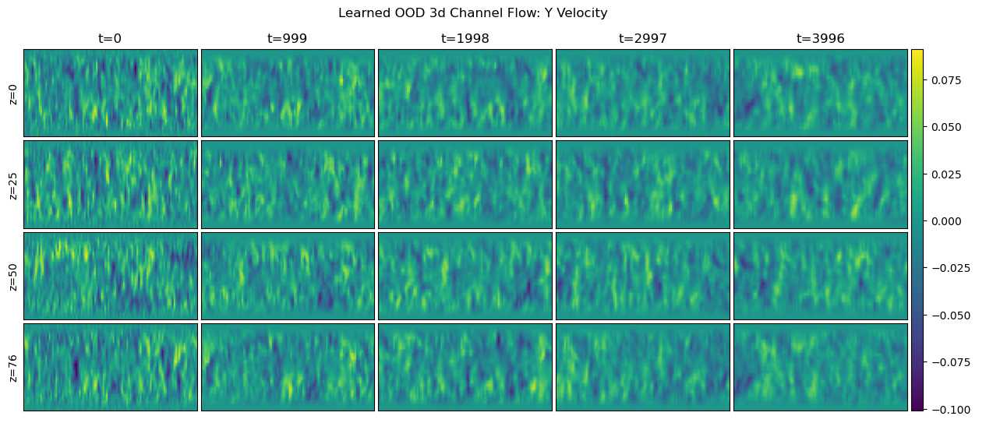

Saving GridFigure to: ./grid_figures/Learned_OOD_3d_Channel_Flow_Y_Velocity.png
##################################################
DNS OOD Simulation:


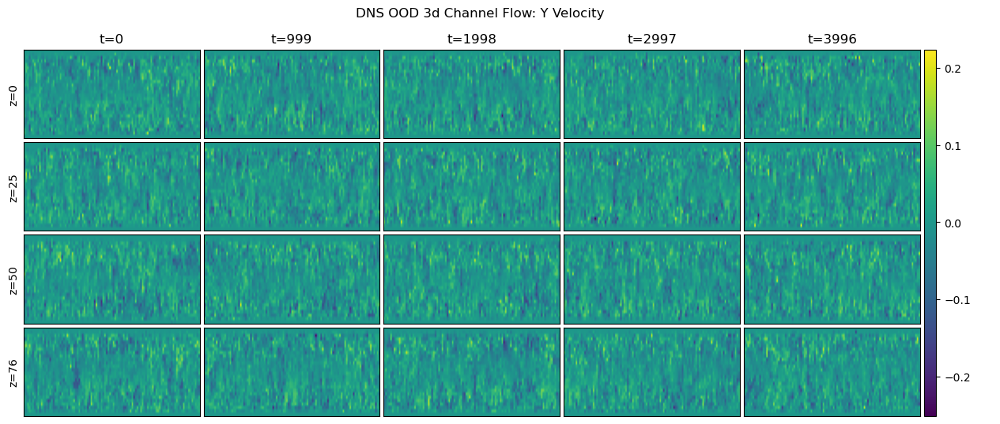

Saving GridFigure to: ./grid_figures/DNS_OOD_3d_Channel_Flow_Y_Velocity.png
##################################################
Learned OOD Simulation:


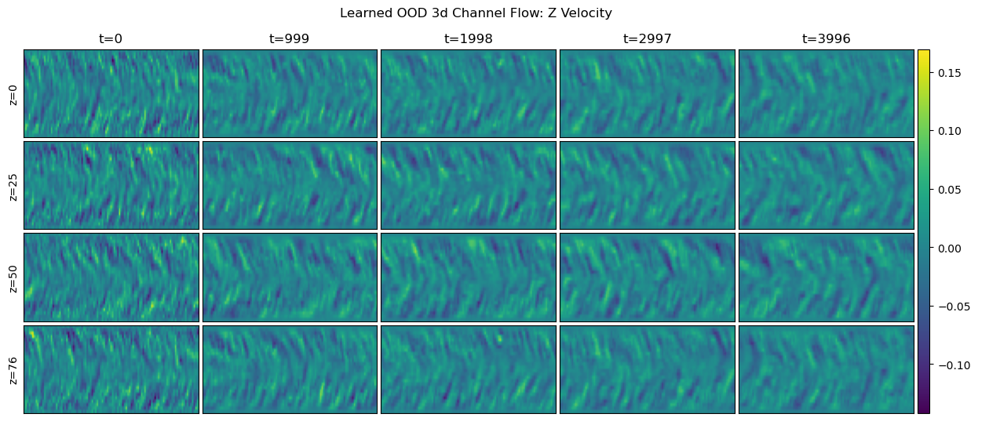

Saving GridFigure to: ./grid_figures/Learned_OOD_3d_Channel_Flow_Z_Velocity.png
##################################################
DNS OOD Simulation:


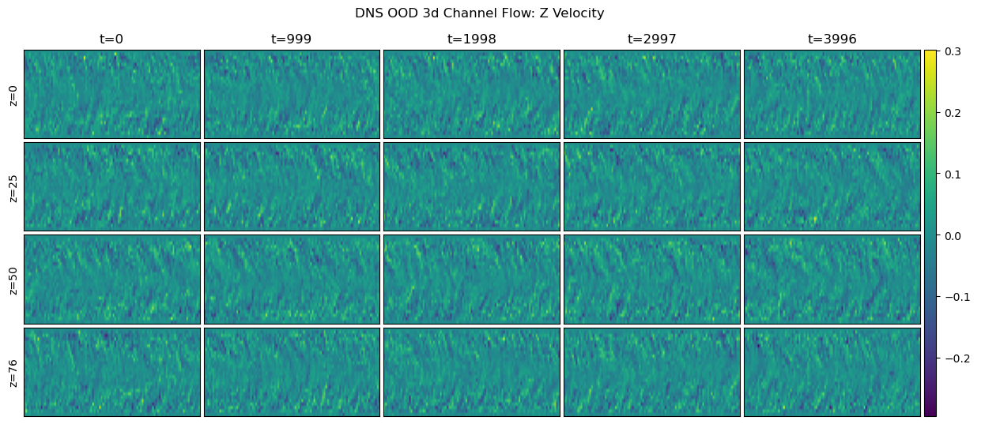

Saving GridFigure to: ./grid_figures/DNS_OOD_3d_Channel_Flow_Z_Velocity.png


In [27]:
create_all_simulation_figs(sim_steps_OOD, no_filter_channel_flow, predicted_prefix='Learned OOD ', true_prefix='DNS OOD ')

#create_all_simulation_figs(sim_steps_uq_OOD*0.7978865, abs_error_OOD, predicted_prefix='Learned UQ OOD ', true_prefix='Abs Error OOD ')

## OOD Detection:

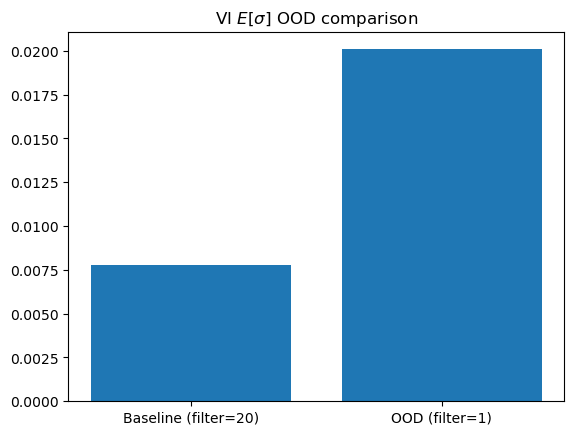

In [49]:
expected_sigma = lambda sigma_tensor: sigma_tensor.mean().item()

plt.bar(['Baseline (filter=20)', 'OOD (filter=1)'], [expected_sigma(sim_steps_uq), expected_sigma(sim_steps_uq_OOD)])
plt.title(r'VI $E[\sigma]$ OOD comparison')
plt.show()

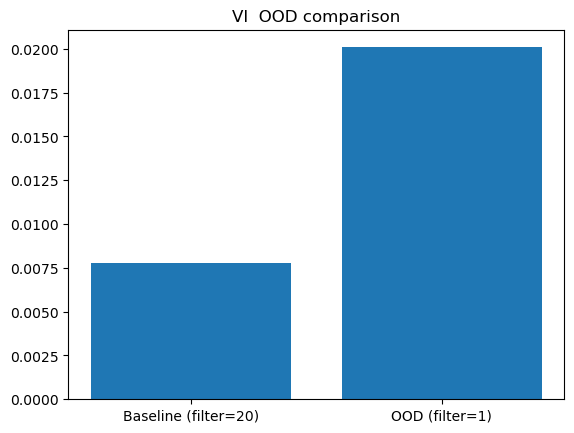

In [47]:
expected_sigma = lambda sigma_tensor: ((sigma_tensor**2).mean()**0.5).item()

plt.bar(['Baseline (filter=20)', 'OOD (filter=1)'], [expected_sigma(sim_steps_uq), expected_sigma(sim_steps_uq_OOD)])
plt.title('VI $E[\\sigma]$ OOD comparison')
plt.show()

## Ravi's FLow Stats Equations:
A good place to start is looking at the energy spectrum which describes how the energy is distributed across wavelengths.
Here’s how to get it: <br>
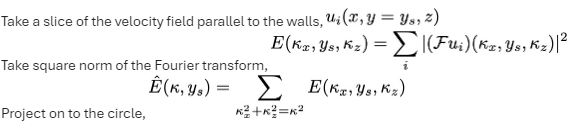

NOTE: Below is my implementation of the the energy spectrum stats code.

## Ravi's Implementation of Energy Spectrum

In [79]:
import numpy as np
import matplotlib.pyplot as plt

def E(u):
    uh = np.fft.rfftn(u,axes=[0,2])
    return np.sum(np.abs(uh)**2,axis=-1)

def npmap(f,a):
    return np.array(list(map(f,a)))

def E1d(u,epsilon_multiplier=1.,nk=30,Lx=8*np.pi,Ly=2.0,Lz=3*np.pi):

    '''

    arguments:

        Lx,Ly,Lz: domain lengths

        epsilon_multiplier: for width of ring to project to point

        nk: number of points along radius to project on to

        u: input function

    output: 
        energy spectrum from u. First axis is the energy spectrum. Second is y coordinate
    '''
    u = u.moveaxis(0,-1) # we need to move the channel dimension (usually infront) to back for compatibility
    print(f'{u.shape=}')

    nx,ny,nz = u.shape[0:-1]
    kx = np.fft.fftfreq(nx,d=Lx/nx)
    kz = np.fft.rfftfreq(nz,d=Lz/nz)
    dk = np.sqrt(kx[1]**2 + kz[1]**2)
    epsilon = epsilon_multiplier*dk
    Kxz = np.stack(np.meshgrid(kx,kz,indexing='ij'),axis=-1)
    K = np.sqrt(Kxz[...,0]**2 + Kxz[...,1]**2)
    k = np.linspace(0,min(np.max(kx),np.max(kz)),nk)
    Eu = E(u)
    return k,2.*np.transpose(npmap(
        lambda j:npmap(
            lambda ki:np.sum(Eu[:,j][np.abs(K-ki)<epsilon]),
            k),
        np.arange(ny)))

def make_energy_spectrum_figure(u, uq=None, k_min=1.0, **kwd_args):
    k,Ek = E1d(u, **kwd_args)
    plt.loglog(k,Ek[:,1:-1])
    y = k**(-5/3)
    plt.plot(k,3e5*y,'r--',linewidth=4)
    plt.xlabel(r'$k$')
    plt.ylabel(r'$\hat{E}(u)$')
    plt.figure()
    
    plt.plot(k[k>k_min],1e5*y[k>k_min],'r--',linewidth=4)
    if uq is None:
        plt.loglog(k[k>k_min],np.mean(Ek[k>k_min],axis=1))
    else:
        plt.xscale('log')
        plt.yscale('log')
        k,Ek_plus = E1d(u+uq, **kwd_args) # upper bound
        k,Ek_minus = E1d(u-uq, **kwd_args) # lower bound
        yerr = np.mean(((Ek_plus[k>k_min]-Ek_minus[k>k_min])**2)**0.5, axis=1)/2 # central difference
        plt.errorbar(k[k>k_min], np.mean(Ek[k>k_min],axis=1), yerr=yerr)

u.shape=torch.Size([103, 26, 77, 3])


/tmp/ipykernel_2770473/2783120732.py:49: RuntimeWarning: divide by zero encountered in power
  y = k**(-5/3)


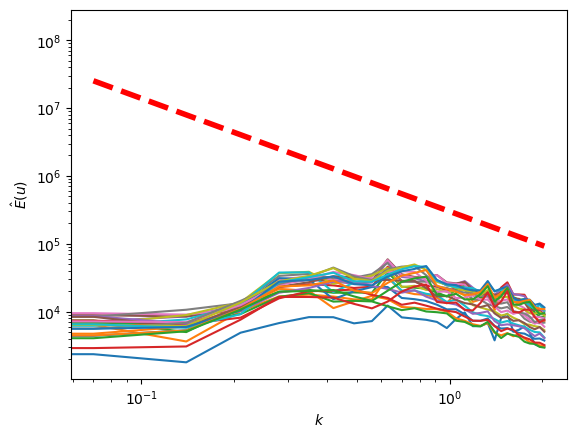

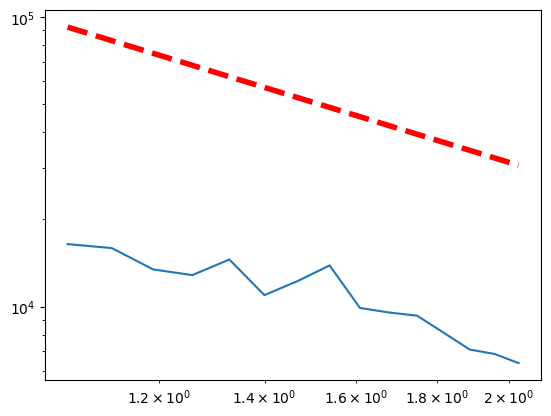

In [80]:
make_energy_spectrum_figure(sim_steps[..., -1], k_min, epsilon_multiplier=0.5)#, Lx=103/10, Ly=26/10, Lz=77/10)#, sim_steps_uq[...,-1]*1.96) # create confidence interval for mean energy spectrum

In [69]:
def make_energy_spectrum_figure(u, uq=None, epsilon_multiplier = 1):
    u = u.moveaxis(0,-1) # we need to move the channel dimension (usually infront) to back for compatibility
    print(f'{u.shape=}')

    nk = 30
    k,Ek = E1d(u,epsilon_multiplier,nk)
    plt.loglog(k,Ek[:,1:-1])
    y = k**(-5/3)
    plt.plot(k,3e5*y,'r--',linewidth=4)
    plt.xlabel(r'$k$')
    plt.ylabel(r'$\hat{E}(u)$')
    
    plt.figure()
    plt.plot(k[k>2],1e5*y[k>2],'r--',linewidth=4)
    plt.xscale('log')
    plt.yscale('log')
    if uq:
        plt.errorbar(k[k>2], np.mean(Ek[k>2],axis=1), yerr=)
    else:
        plt.plot(k[k>2],np.mean(Ek[k>2],axis=1))

SyntaxError: invalid syntax (2306825581.py, line 18)

## Make Energy Spectrum Figure for DNS

u.shape=torch.Size([103, 26, 77, 3])


/tmp/ipykernel_1647779/1821766585.py:66: RuntimeWarning: divide by zero encountered in power
  y = k**(-5/3)


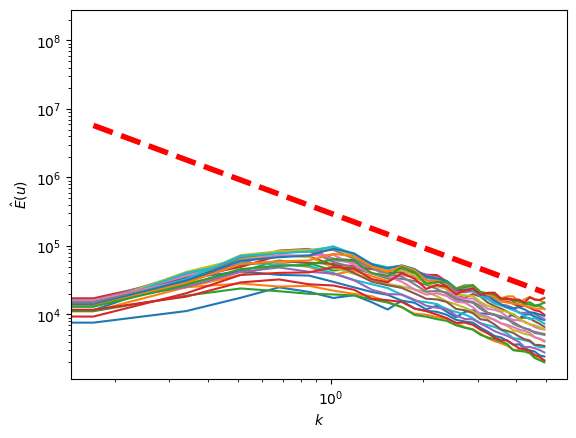

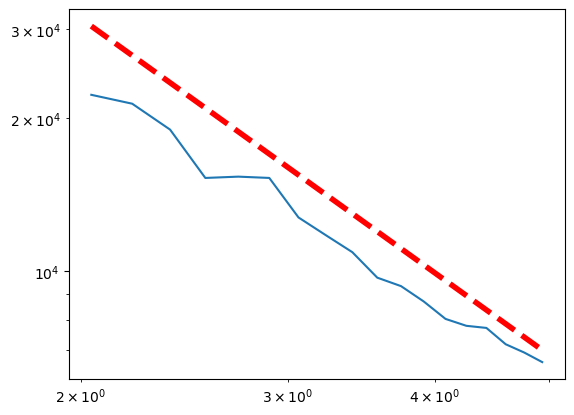

In [9]:
make_energy_spectrum_figure(real_channel_flow[...,-1]) # use last timestep

## Make Energy Spectrum Figure for Learned Simulation

In [50]:
make_energy_spectrum_figure(sim_steps[...,-1]) # use last timestep

NameError: name 'make_energy_spectrum_figure' is not defined